# Estimate plasma-cell developmental potential with CytoTRACE

**Biology rationale.** Stemness-like transcriptional diversity may identify proliferative residual plasma-cell states associated with treatment persistence.

**Aim.** Compute CytoTRACE-derived ordering and relate it to cNMF program activity and clinical annotations.

**Data input.** `counts_clean.h5ad`, `facet_umap_cytotrace_by_origident.png`, `GEP11_vs_other_within_each_sample_statistics.csv`, `GEP11_fraction_by_sample.csv`, `adata_obs_with_cytotrace_GEPs_and_GEP11.csv`



**Data outputs.** `plasma_cnmf_3_usage_norm_withoutIG_k=13.csv`, `cytotrace_pseudotime_cell_table.csv`, `cytotrace_pseudotime_cell_table.tsv`, `parsed_sample_table.csv`, `sample_level_score_summary.csv`

## 1. Core imports


In [1]:
# Core imports
import re
from math import ceil
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scanpy as sc
import scvelo as scv
import cellrank as cr
from cellrank.kernels import CytoTRACEKernel

from scipy import stats
from statsmodels.stats.multitest import multipletests

%matplotlib inline
%config InlineBackend.figure_format = "svg"


In [2]:
# ============================================================
# 0) User settings
# ============================================================

input_h5ad = "counts_clean.h5ad"
sample_col = "orig.ident"
embedding_key = "X_umap"

# cNMF GEP usage table
usage_csv = "plasma_cnmf_3_usage_norm_withoutIG_k=13.csv"
usage_threshold = 0.20
usage_priority = ["Usage_11", "Usage_2"]

# All outputs remain inside this folder
figdir = Path("./cytotrace_origident_figures")
figdir.mkdir(parents=True, exist_ok=True)

gep_boxplot_dir = figdir / "GEP11_vs_other_score_boxplots"
gep_boxplot_dir.mkdir(parents=True, exist_ok=True)

sc.settings.figdir = str(figdir)
sc.settings.file_format_figs = "pdf"
sc.settings.set_figure_params(dpi=150, facecolor="white", frameon=False)
cr.settings.verbosity = 2

save_figures = True
show_figures = True


In [3]:
# ============================================================
# 1) Helpers
# ============================================================

def safe_filename(x):
    return re.sub(r"[^A-Za-z0-9_.-]+", "_", str(x))


def get_scanpy_basis(adata, embedding_key="X_umap"):
    if embedding_key in adata.obsm:
        return embedding_key[2:] if embedding_key.startswith("X_") else embedding_key
    if "X_umap" in adata.obsm:
        return "umap"
    if "umap" in adata.obsm:
        return "umap"
    raise KeyError(f"No embedding found. Available adata.obsm keys: {list(adata.obsm.keys())}")


def get_obsm_key(adata, embedding_key="X_umap"):
    if embedding_key in adata.obsm:
        return embedding_key
    if embedding_key.startswith("X_") and embedding_key[2:] in adata.obsm:
        return embedding_key[2:]
    if "X_umap" in adata.obsm:
        return "X_umap"
    if "umap" in adata.obsm:
        return "umap"
    raise KeyError(f"No embedding found. Available adata.obsm keys: {list(adata.obsm.keys())}")


def ensure_categorical_order(adata, col):
    values = adata.obs[col].astype(str)
    levels = sorted(values.dropna().unique())
    adata.obs[col] = pd.Categorical(values, categories=levels, ordered=True)
    return levels


def maybe_savefig(filename):
    if save_figures:
        out = figdir / filename
        plt.savefig(out, bbox_inches="tight")
        print(f"Saved: {out}")


def show_or_close(fig):
    if show_figures:
        plt.show()
    else:
        plt.close(fig)


def plot_embedding_facets_by_sample(
    adata,
    color_key,
    sample_col="orig.ident",
    embedding_key="X_umap",
    ncols=4,
    point_size=4,
    cmap="viridis",
    background_size=1,
    background_alpha=0.10,
    filename=None,
):
    embedding_key_use = get_obsm_key(adata, embedding_key)

    if sample_col not in adata.obs.columns:
        raise KeyError(f"{sample_col!r} not found in adata.obs")
    if color_key not in adata.obs.columns:
        raise KeyError(f"{color_key!r} not found in adata.obs")

    emb = adata.obsm[embedding_key_use]
    if hasattr(adata.obs[sample_col].dtype, "categories"):
        samples = list(adata.obs[sample_col].cat.categories)
    else:
        samples = sorted(adata.obs[sample_col].astype(str).unique())

    n = len(samples)
    ncols = min(ncols, n)
    nrows = ceil(n / ncols)

    values_all = pd.to_numeric(adata.obs[color_key], errors="coerce")
    finite = values_all[np.isfinite(values_all)]
    if finite.empty:
        raise ValueError(f"{color_key!r} has no finite numeric values to plot.")

    vmin, vmax = np.nanpercentile(finite, [1, 99])
    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmin == vmax:
        vmin, vmax = float(finite.min()), float(finite.max())

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(3.2 * ncols, 3.0 * nrows),
        squeeze=False,
    )
    for ax in axes.flat:
        ax.axis("off")

    scatter = None
    obs_names = np.asarray(adata.obs_names)

    for i, sample in enumerate(samples):
        ax = axes.flat[i]
        ax.scatter(
            emb[:, 0], emb[:, 1],
            s=background_size,
            c="lightgray",
            alpha=background_alpha,
            linewidths=0,
        )

        mask = adata.obs[sample_col].astype(str).values == str(sample)
        scatter = ax.scatter(
            emb[mask, 0], emb[mask, 1],
            c=values_all.reindex(obs_names[mask]),
            s=point_size,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            linewidths=0,
        )
        ax.set_title(str(sample), fontsize=9)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_frame_on(False)

    if scatter is not None:
        cbar = fig.colorbar(scatter, ax=axes, fraction=0.02, pad=0.01)
        cbar.set_label(color_key)

    fig.suptitle(f"{color_key} split by {sample_col}", y=1.02)

    if filename is not None:
        maybe_savefig(filename)

    show_or_close(fig)


def export_pseudotime_table(
    adata,
    out_dir,
    sample_col="orig.ident",
    pseudotime_key="ct_pseudotime",
    score_key="ct_score",
):
    if pseudotime_key not in adata.obs.columns:
        raise KeyError(f"{pseudotime_key!r} not found in adata.obs.")

    cols = [
        c for c in [sample_col, pseudotime_key, score_key]
        if c in adata.obs.columns
    ]

    table = adata.obs[cols].copy()
    table.insert(0, "cell_id", adata.obs_names.astype(str))
    table["cell_id_no_10x_suffix"] = table["cell_id"].str.replace(
        r"-\d+$", "", regex=True
    )

    csv_path = Path(out_dir) / "cytotrace_pseudotime_cell_table.csv"
    tsv_path = Path(out_dir) / "cytotrace_pseudotime_cell_table.tsv"

    table.to_csv(csv_path, index=False)
    table.to_csv(tsv_path, sep="\t", index=False)

    print(f"Saved: {csv_path}")
    print(f"Saved: {tsv_path}")
    return table


def parse_orig_ident(x):
    s = str(x)
    s2 = re.sub(r"plasma$", "", s, flags=re.I)

    if re.search(r"pre$", s2, flags=re.I):
        return re.sub(r"pre$", "", s2, flags=re.I), "Pre"
    if re.search(r"post$", s2, flags=re.I):
        return re.sub(r"post$", "", s2, flags=re.I), "Post"
    if re.search(r"refrac$", s2, flags=re.I):
        return re.sub(r"refrac$", "", s2, flags=re.I), "Refrac"
    return s2, "Single"


def format_p_for_plot(p):
    if pd.isna(p):
        return "p = NA"
    if p < 1e-4:
        return f"p = {p:.1e}"
    return f"p = {p:.4f}"


In [4]:
# ============================================================
# 2) Load AnnData and compute CytoTRACE
# ============================================================

adata = sc.read_h5ad(input_h5ad)
print(adata)

if sample_col not in adata.obs.columns:
    raise KeyError(
        f"{sample_col!r} not found in adata.obs. "
        f"Available columns include: {list(adata.obs.columns)[:30]}"
    )

sample_levels = ensure_categorical_order(adata, sample_col)
basis = get_scanpy_basis(adata, embedding_key)

if "spliced" not in adata.layers:
    adata.layers["spliced"] = adata.X.copy()
if "unspliced" not in adata.layers:
    adata.layers["unspliced"] = adata.X.copy()

scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
ctk = CytoTRACEKernel(adata).compute_cytotrace()

if "ct_pseudotime" not in adata.obs.columns:
    raise RuntimeError(
        "CytoTRACE finished but did not create adata.obs['ct_pseudotime']."
    )

print(adata.obs["ct_pseudotime"].describe())
if "ct_score" in adata.obs.columns:
    print(adata.obs["ct_score"].describe())


AnnData object with n_obs × n_vars = 181834 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ig', 'percent.hb', 'unintegrated_clusters', 'seurat_clusters', 'barcode', 'subtype', 'mutation', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'barcode.1', 'clonotype', 'orig.ident.1', 'clonotype_plot', 'labeltreat', 'Annotation'
    var: 'vf_vst_counts_mean', 'vf_vst_counts_variance', 'vf_vst_counts_variance.expected', 'vf_vst_counts_variance.standardized', 'vf_vst_counts_variable', 'vf_vst_counts_rank', 'var.features', 'var.features.rank'
    obsm: 'X_pca', 'X_umap'
computing neighbors
    finished (0:00:49) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:07:05) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Computing CytoTRACE score with `36601` genes
Adding `adata.obs['ct_score']`
       `adata.obs['ct_pseudotime']`
       `ada

Saved: cytotrace_origident_figures/cytotrace_pseudotime_cell_table.csv
Saved: cytotrace_origident_figures/cytotrace_pseudotime_cell_table.tsv


/home/miniconda3/envs/cassiopeia/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


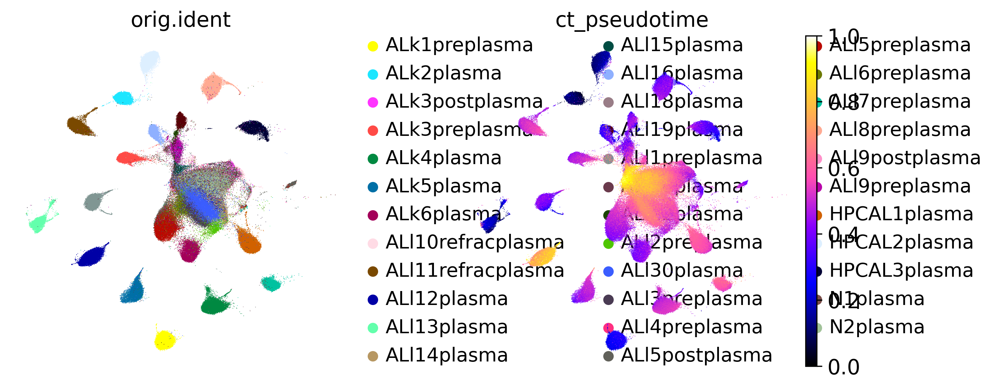

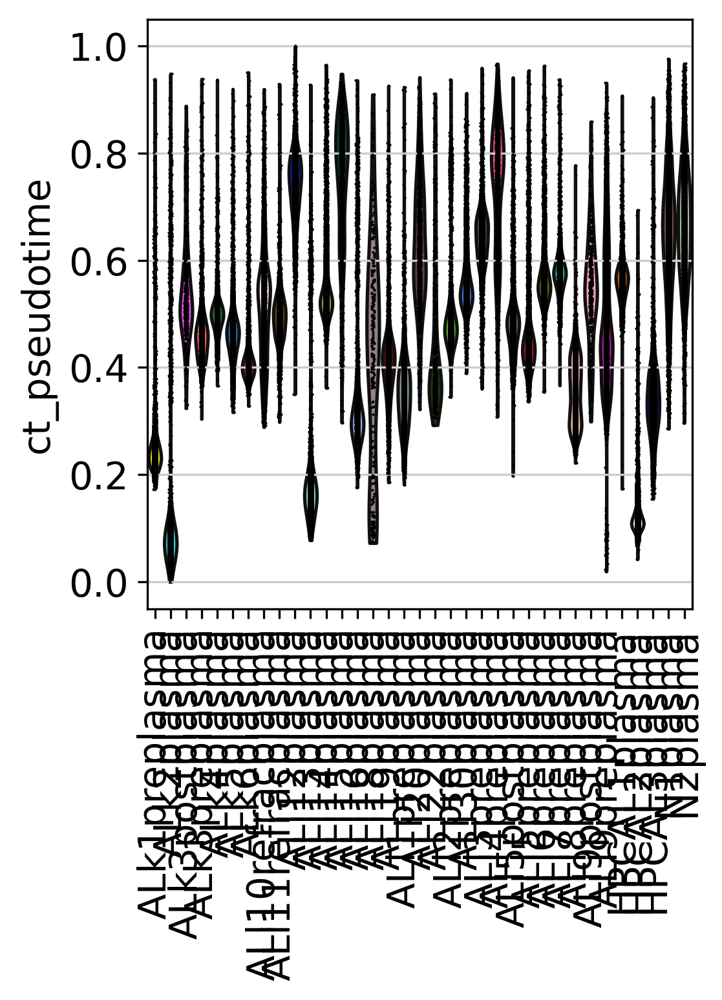

Saved: cytotrace_origident_figures/facet_umap_cytotrace_by_origident.png


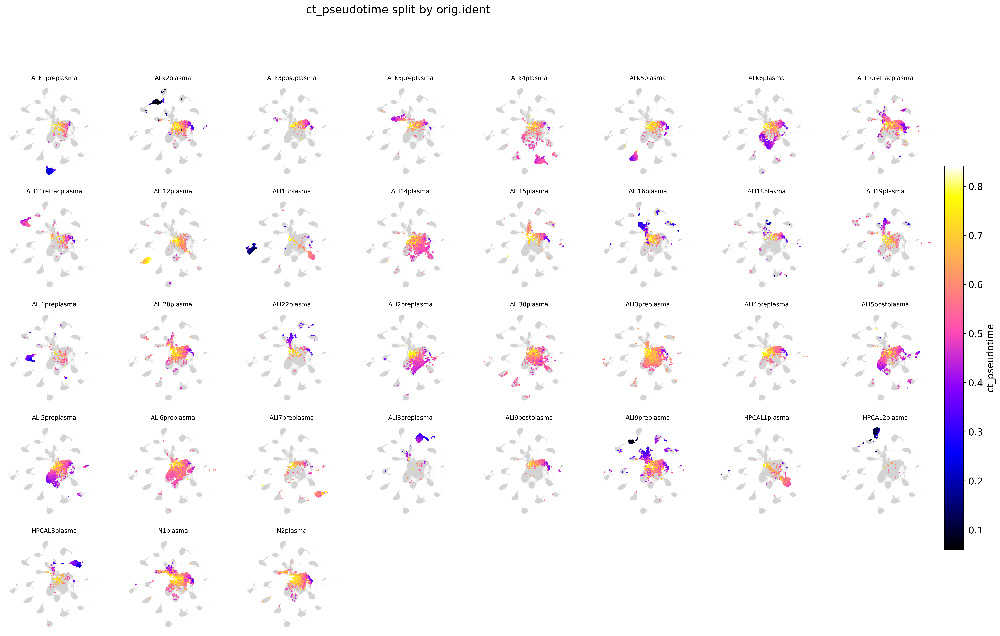

In [5]:
# ============================================================
# 3) CytoTRACE outputs
# ============================================================

pseudotime_table = export_pseudotime_table(
    adata=adata,
    out_dir=figdir,
    sample_col=sample_col,
    pseudotime_key="ct_pseudotime",
    score_key="ct_score",
)

sc.pl.embedding(
    adata,
    basis=basis,
    color=[sample_col, "ct_pseudotime"],
    color_map="gnuplot2",
    frameon=False,
    ncols=2,
    show=show_figures,
    save="_global_origident_cytotrace" if save_figures else None,
)

sc.pl.violin(
    adata,
    keys=["ct_pseudotime"],
    groupby=sample_col,
    rotation=90,
    show=show_figures,
    save="_cytotrace_by_origident" if save_figures else None,
)

plot_embedding_facets_by_sample(
    adata,
    color_key="ct_pseudotime",
    sample_col=sample_col,
    embedding_key=embedding_key,
    ncols=8,
    point_size=5,
    cmap="gnuplot2",
    filename="facet_umap_cytotrace_by_origident.png",
)


## 2. Gene-expression program analysis


Usage scores aligned to 181826/181834 cells.
Usage columns: ['Usage_1', 'Usage_2', 'Usage_3', 'Usage_4', 'Usage_5', 'Usage_6', 'Usage_7', 'Usage_8', 'Usage_9', 'Usage_10', 'Usage_11', 'Usage_12', 'Usage_13']
cnmf_group
Other        132344
Usage_2+      47887
Usage_11+      1603
Name: count, dtype: int64


/home/miniconda3/envs/cassiopeia/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


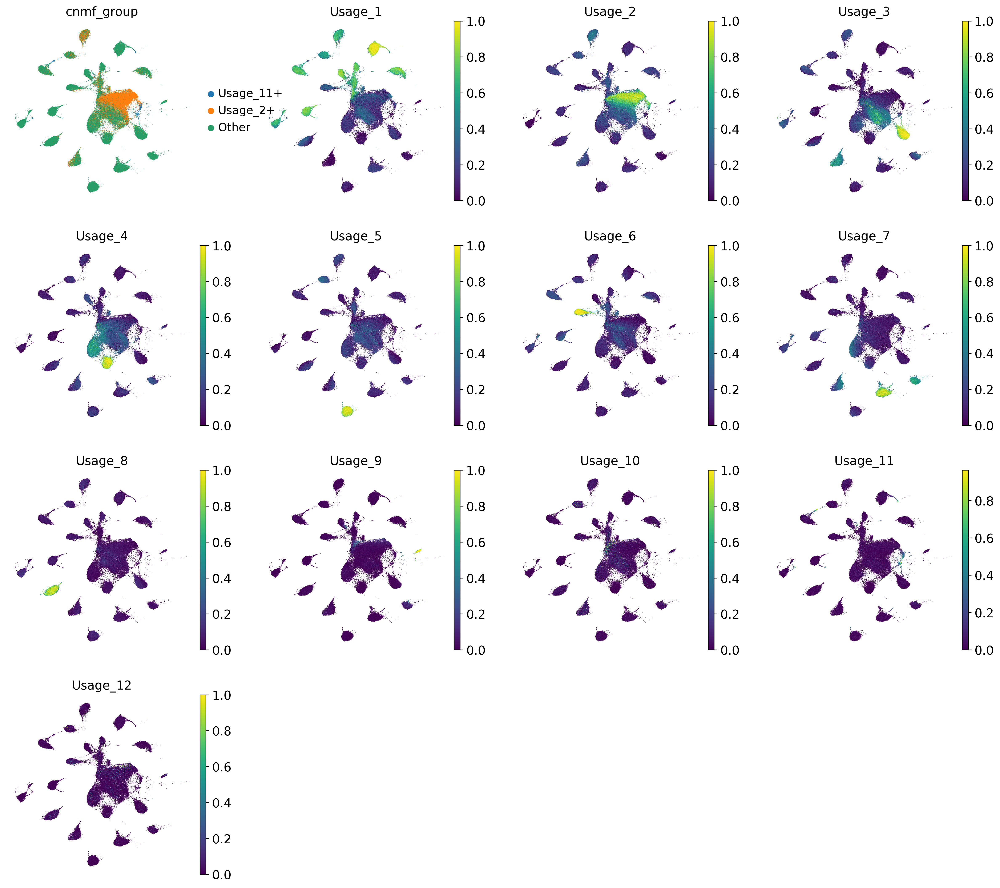

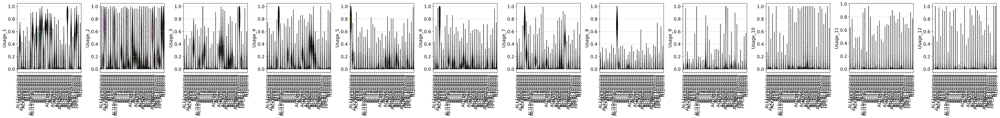

In [6]:
# ============================================================
# 4) Read and align cNMF GEP usage scores
# ============================================================

usage_path = Path(usage_csv)
if not usage_path.exists():
    raise FileNotFoundError(f"GEP usage table not found: {usage_path}")

usage = pd.read_csv(usage_path)

if "X" in usage.columns:
    usage = usage.set_index("X")
else:
    usage = usage.set_index(usage.columns[0])

usage.index = usage.index.astype(str).str.strip()
usage = usage.apply(pd.to_numeric, errors="coerce")

adata.obs_names = adata.obs_names.astype(str).str.strip()
usage_aligned = usage.reindex(adata.obs_names)

# Same rerun-safe behavior as the original notebook
existing_usage_cols = [c for c in usage.columns if c in adata.obs.columns]
if existing_usage_cols:
    adata.obs = adata.obs.drop(columns=existing_usage_cols)

adata.obs = adata.obs.join(usage_aligned, how="left")
usage_cols = [
    c for c in usage.columns
    if c.startswith("Usage_") and c in adata.obs.columns
]

print(
    f"Usage scores aligned to "
    f"{usage_aligned.notna().any(axis=1).sum()}/{adata.n_obs} cells."
)
print("Usage columns:", usage_cols)

# Preserve the original prioritized cNMF grouping
group = pd.Series("Other", index=adata.obs_names, dtype="object")
already = pd.Series(False, index=adata.obs_names)
categories = []

for usage_col in usage_priority:
    if usage_col not in adata.obs.columns:
        continue

    adata.obs[usage_col] = pd.to_numeric(
        adata.obs[usage_col], errors="coerce"
    )
    label = f"{usage_col}+"
    mask = (adata.obs[usage_col] >= usage_threshold) & (~already)
    group.loc[mask] = label
    already.loc[mask] = True
    categories.append(label)

categories.append("Other")
adata.obs["cnmf_group"] = pd.Categorical(
    group,
    categories=categories,
    ordered=True,
)

print(adata.obs["cnmf_group"].value_counts(dropna=False))

sc.pl.embedding(
    adata,
    basis=basis,
    color=["cnmf_group"] + usage_cols[:12],
    frameon=False,
    ncols=4,
    show=show_figures,
    save="_cnmf_usage_scores_umap" if save_figures else None,
)

sc.pl.violin(
    adata,
    keys=usage_cols[:12],
    groupby=sample_col,
    rotation=90,
    multi_panel=True,
    show=show_figures,
    save="_cnmf_usage_scores_by_origident" if save_figures else None,
)


In [7]:
# ============================================================
# 5) Parse sample metadata and define GEP11 / Usage_11+ status
# ============================================================

sample_ids = adata.obs[sample_col].astype(str).drop_duplicates().tolist()
sample_table = pd.DataFrame({"sample_id": sample_ids})

parsed = [parse_orig_ident(x) for x in sample_table["sample_id"]]
sample_table["patient_id"] = [x[0] for x in parsed]
sample_table["timepoint"] = [x[1] for x in parsed]

timepoint_order = ["Pre", "Post", "Refrac", "Single"]
sample_table["timepoint"] = pd.Categorical(
    sample_table["timepoint"],
    categories=timepoint_order,
    ordered=True,
)
sample_table = sample_table.sort_values(
    ["patient_id", "timepoint", "sample_id"]
)
sample_table.to_csv(figdir / "parsed_sample_table.csv", index=False)

sample_to_patient = dict(
    zip(sample_table["sample_id"], sample_table["patient_id"])
)
sample_to_timepoint = dict(
    zip(sample_table["sample_id"], sample_table["timepoint"].astype(str))
)

adata.obs["patient_id"] = (
    adata.obs[sample_col].astype(str).map(sample_to_patient).astype("category")
)
adata.obs["timepoint"] = (
    adata.obs[sample_col].astype(str).map(sample_to_timepoint)
)
adata.obs["timepoint"] = pd.Categorical(
    adata.obs["timepoint"],
    categories=timepoint_order,
    ordered=True,
)

# Same hierarchy and threshold as the original notebook
gep11_threshold = usage_threshold

if "GEP11_status" in adata.obs.columns:
    print("GEP11_status already exists; using existing column.")

elif "cnmf_group" in adata.obs.columns:
    adata.obs["GEP11_status"] = np.where(
        adata.obs["cnmf_group"].astype(str).str.contains(
            r"(^|[^0-9])GEP11([^0-9]|$)|Usage_11",
            case=False,
            regex=True,
            na=False,
        ),
        "GEP11",
        "Other",
    )

elif "state_info" in adata.obs.columns:
    adata.obs["GEP11_status"] = np.where(
        adata.obs["state_info"].astype(str).str.contains(
            r"(^|[^0-9])GEP11([^0-9]|$)|Usage_11",
            case=False,
            regex=True,
            na=False,
        ),
        "GEP11",
        "Other",
    )

elif "Usage_11" in adata.obs.columns:
    adata.obs["GEP11_status"] = np.where(
        pd.to_numeric(adata.obs["Usage_11"], errors="coerce")
        >= gep11_threshold,
        "GEP11",
        "Other",
    )

elif "Usage_11_usage" in adata.obs.columns:
    adata.obs["GEP11_status"] = np.where(
        pd.to_numeric(adata.obs["Usage_11_usage"], errors="coerce")
        >= gep11_threshold,
        "GEP11",
        "Other",
    )

elif "GEP11" in adata.obs.columns:
    adata.obs["GEP11_status"] = np.where(
        pd.to_numeric(adata.obs["GEP11"], errors="coerce")
        >= gep11_threshold,
        "GEP11",
        "Other",
    )

else:
    adata.obs["GEP11_status"] = "Unknown"
    print(
        "Warning: could not find cnmf_group, state_info, "
        "Usage_11, Usage_11_usage, or GEP11."
    )

adata.obs["GEP11_status"] = pd.Categorical(
    adata.obs["GEP11_status"],
    categories=["Other", "GEP11", "Unknown"],
    ordered=True,
)

print(adata.obs["GEP11_status"].value_counts(dropna=False))
display(sample_table)


GEP11_status
Other      180231
GEP11        1603
Unknown         0
Name: count, dtype: int64


/tmp/ipykernel_3356749/35338849.py:50: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  adata.obs["cnmf_group"].astype(str).str.contains(


,sample_id,patient_id,timepoint
4,ALk1preplasma,ALk1,Pre
11,ALk2plasma,ALk2,Single
22,ALk3preplasma,ALk3,Pre
21,ALk3postplasma,ALk3,Post
23,ALk4plasma,ALk4,Single
3,ALk5plasma,ALk5,Single
25,ALk6plasma,ALk6,Single
28,ALl1preplasma,ALl1,Pre
1,ALl10refracplasma,ALl10,Refrac
2,ALl11refracplasma,ALl11,Refrac


In [8]:
# ============================================================
# 6) Preserve the original narrowed score-column selection
# ============================================================

meta_cols_to_keep = [
    sample_col,
    "patient_id",
    "timepoint",
    "GEP11_status",
    "cnmf_group",
]

meta_cols_to_keep = [
    c for c in meta_cols_to_keep if c in adata.obs.columns
]

score_name_patterns = [
    r"^ct_pseudotime$",
    r"^Usage_11(?:_usage)?$",
    r"^S\.Score$",
    r"^G2M\.Score$",
    r"^ct_score$",
    r"^score_Stemness_broad$",
    r"^score_HSPC$",
    r"^Usage_[1-9](?:_usage)?$",
]

raw_score_cols = []
for col in adata.obs.columns:
    if col in [sample_col, "patient_id", "timepoint", "GEP11_status"]:
        continue

    if pd.api.types.is_numeric_dtype(adata.obs[col]):
        if any(
            re.match(pattern, str(col), flags=re.I)
            for pattern in score_name_patterns
        ):
            raw_score_cols.append(col)


def canonical_usage_name(col):
    match = re.match(
        r"^(Usage_\d+)(?:_usage)?$",
        str(col),
        flags=re.I,
    )
    return match.group(1) if match else col


usage_groups = {}
non_usage_cols = []

for col in raw_score_cols:
    canonical = canonical_usage_name(col)
    if re.match(r"^Usage_\d+$", canonical):
        usage_groups.setdefault(canonical, []).append(col)
    else:
        non_usage_cols.append(col)

dedup_usage_cols = []
for canonical, cols in usage_groups.items():
    dedup_usage_cols.append(canonical if canonical in cols else cols[0])

score_cols = non_usage_cols + dedup_usage_cols

priority = [
    "ct_pseudotime",
    "Usage_11",
    "S.Score",
    "G2M.Score",
    "ct_score",
    "score_Stemness_broad",
    "score_HSPC",
    "Usage_1",
    "Usage_2",
    "Usage_3",
    "Usage_4",
    "Usage_5",
    "Usage_6",
    "Usage_7",
    "Usage_8",
    "Usage_9",
]

score_cols = (
    [c for c in priority if c in score_cols]
    + [c for c in score_cols if c not in priority]
)
score_cols = list(dict.fromkeys(score_cols))

if len(score_cols) == 0:
    raise ValueError(
        "No requested score columns were detected in adata.obs."
    )

print("Score columns used:")
print(score_cols)

obs_small_cols = list(dict.fromkeys(meta_cols_to_keep + score_cols))
obs_small = adata.obs[obs_small_cols].copy()

for col in score_cols:
    obs_small[col] = pd.to_numeric(obs_small[col], errors="coerce")


Score columns used:
['ct_pseudotime', 'Usage_11', 'S.Score', 'G2M.Score', 'ct_score', 'Usage_1', 'Usage_2', 'Usage_3', 'Usage_4', 'Usage_5', 'Usage_6', 'Usage_7', 'Usage_8', 'Usage_9']


## 3. GEP11 / Usage_11+ summaries and within-sample statistics


In [9]:
# ============================================================
# 7) GEP11 / Usage_11+ summaries and within-sample statistics
# ============================================================

sample_summary = (
    obs_small
    .groupby(
        [sample_col, "patient_id", "timepoint"],
        observed=True,
    )[score_cols]
    .agg(["mean", "median", "std", "count"])
)
sample_summary.to_csv(figdir / "sample_level_score_summary.csv")

sample_gep_summary = (
    obs_small
    .query("GEP11_status in ['GEP11', 'Other']")
    .groupby(
        [sample_col, "patient_id", "timepoint", "GEP11_status"],
        observed=True,
    )[score_cols]
    .mean()
    .reset_index()
)
sample_gep_summary.to_csv(
    figdir / "sample_level_GEP11_vs_other_score_summary.csv",
    index=False,
)

gep11_sample_results = []

for sample_id in sample_table["sample_id"].astype(str):
    sub = obs_small[
        (obs_small[sample_col].astype(str) == sample_id)
        & (
            obs_small["GEP11_status"]
            .astype(str)
            .isin(["GEP11", "Other"])
        )
    ]

    for score in score_cols:
        x = sub.loc[
            sub["GEP11_status"].astype(str) == "GEP11", score
        ].dropna()
        y = sub.loc[
            sub["GEP11_status"].astype(str) == "Other", score
        ].dropna()

        if len(x) >= 10 and len(y) >= 10:
            statistic, p_value = stats.mannwhitneyu(
                x, y, alternative="two-sided"
            )
            test = "mannwhitney_within_sample"
        else:
            statistic, p_value = np.nan, np.nan
            test = "insufficient_cells"

        gep11_sample_results.append({
            "sample_id": sample_id,
            "patient_id": sample_to_patient[sample_id],
            "timepoint": sample_to_timepoint[sample_id],
            "score": score,
            "n_GEP11": len(x),
            "n_Other": len(y),
            "mean_GEP11": x.mean() if len(x) else np.nan,
            "mean_Other": y.mean() if len(y) else np.nan,
            "delta_GEP11_minus_Other": (
                x.mean() - y.mean()
                if len(x) and len(y)
                else np.nan
            ),
            "p_value": p_value,
            "statistic": statistic,
            "test": test,
        })

gep11_sample_results = pd.DataFrame(gep11_sample_results)

if gep11_sample_results["p_value"].notna().any():
    valid = gep11_sample_results["p_value"].notna()
    gep11_sample_results.loc[valid, "q_value"] = multipletests(
        gep11_sample_results.loc[valid, "p_value"],
        method="fdr_bh",
    )[1]
else:
    gep11_sample_results["q_value"] = np.nan

gep11_sample_results.to_csv(
    figdir / "GEP11_vs_other_within_each_sample_statistics.csv",
    index=False,
)

display(sample_gep_summary.head())
display(gep11_sample_results.head(20))


,orig.ident,patient_id,timepoint,GEP11_status,ct_pseudotime,Usage_11,S.Score,G2M.Score,ct_score,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7,Usage_8,Usage_9
0,ALk1preplasma,ALk1,Pre,Other,0.244732,0.003073,0.001418,-0.000663,0.755268,0.021270,0.034343,0.019900,0.052880,0.759001,0.023877,0.048628,0.028668,0.002373
1,ALk1preplasma,ALk1,Pre,GEP11,0.374765,0.420294,0.175226,0.322879,0.625235,0.000534,0.009404,0.017203,0.016463,0.487064,0.010223,0.014965,0.020147,0.000486
2,ALk2plasma,ALk2,Single,Other,0.121250,0.004749,-0.006275,-0.025271,0.878750,0.366176,0.183445,0.050365,0.045306,0.182564,0.059802,0.031715,0.031809,0.004494
3,ALk2plasma,ALk2,Single,GEP11,0.309236,0.349073,0.098752,0.129395,0.690764,0.073763,0.396081,0.023426,0.023915,0.058590,0.018741,0.026651,0.015970,0.004030
4,ALk3postplasma,ALk3,Post,Other,0.546774,0.009241,-0.010307,-0.014191,0.453226,0.051901,0.643607,0.020818,0.047299,0.032781,0.057855,0.024594,0.020215,0.047839


,sample_id,patient_id,timepoint,score,n_GEP11,n_Other,mean_GEP11,mean_Other,delta_GEP11_minus_Other,p_value,statistic,test,q_value
0,ALk1preplasma,ALk1,Pre,ct_pseudotime,16,7733,0.374765,0.244732,0.130033,1.675355e-08,112304.0,mannwhitney_within_sample,4.928944e-08
1,ALk1preplasma,ALk1,Pre,Usage_11,16,7733,0.420294,0.003073,0.417221,2.127920e-20,123728.0,mannwhitney_within_sample,1.183474e-19
2,ALk1preplasma,ALk1,Pre,S.Score,16,7733,0.175226,0.001418,0.173808,2.538503e-10,118401.0,mannwhitney_within_sample,8.884762e-10
3,ALk1preplasma,ALk1,Pre,G2M.Score,16,7733,0.322879,-0.000663,0.323542,1.124861e-11,122557.0,mannwhitney_within_sample,4.477390e-11
4,ALk1preplasma,ALk1,Pre,ct_score,16,7733,0.625235,0.755268,-0.130033,1.675355e-08,11424.0,mannwhitney_within_sample,4.928944e-08
5,ALk1preplasma,ALk1,Pre,Usage_1,16,7733,0.000534,0.021270,-0.020736,1.056736e-02,42210.0,mannwhitney_within_sample,1.744044e-02
6,ALk1preplasma,ALk1,Pre,Usage_2,16,7733,0.009404,0.034343,-0.024939,7.611761e-02,47301.0,mannwhitney_within_sample,1.076786e-01
7,ALk1preplasma,ALk1,Pre,Usage_3,16,7733,0.017203,0.019900,-0.002697,5.546951e-01,66467.0,mannwhitney_within_sample,6.221166e-01
8,ALk1preplasma,ALk1,Pre,Usage_4,16,7733,0.016463,0.052880,-0.036417,1.120682e-02,39866.0,mannwhitney_within_sample,1.827297e-02
9,ALk1preplasma,ALk1,Pre,Usage_5,16,7733,0.487064,0.759001,-0.271937,1.042319e-09,7310.0,mannwhitney_within_sample,3.526513e-09


In [10]:
# ============================================================
# 8) GEP11 / Usage_11+ fraction by sample
# ============================================================

gep11_fraction = (
    obs_small
    .assign(
        is_GEP11=lambda x: (
            x["GEP11_status"].astype(str).eq("GEP11")
        )
    )
    .groupby(
        [sample_col, "patient_id", "timepoint"],
        observed=True,
    )
    .agg(
        n_cells=("is_GEP11", "size"),
        n_GEP11=("is_GEP11", "sum"),
        frac_GEP11=("is_GEP11", "mean"),
    )
    .reset_index()
)

gep11_fraction.to_csv(
    figdir / "GEP11_fraction_by_sample.csv",
    index=False,
)

display(gep11_fraction)


,orig.ident,patient_id,timepoint,n_cells,n_GEP11,frac_GEP11
0,ALk1preplasma,ALk1,Pre,7749,16,0.002065
1,ALk2plasma,ALk2,Single,5859,42,0.007168
2,ALk3postplasma,ALk3,Post,439,9,0.020501
3,ALk3preplasma,ALk3,Pre,6156,15,0.002437
4,ALk4plasma,ALk4,Single,8335,14,0.001680
5,ALk5plasma,ALk5,Single,6379,17,0.002665
6,ALk6plasma,ALk6,Single,6253,14,0.002239
7,ALl10refracplasma,ALl10,Refrac,3396,206,0.060660
8,ALl11refracplasma,ALl11,Refrac,7701,252,0.032723
9,ALl12plasma,ALl12,Single,8105,11,0.001357


,score,n_GEP11,n_Other,mean_GEP11,mean_Other,median_GEP11,median_Other,delta_mean_GEP11_minus_Other,delta_median_GEP11_minus_Other,statistic,p_value,test,q_value
1,Usage_11,1603,180223,0.419263,0.006484,0.364279,0.000000,0.412779,0.364279,288897469.0,0.000000e+00,mannwhitney_single_cell_GEP11_vs_Other,0.000000e+00
2,S.Score,1603,180231,0.125693,-0.002479,0.100694,-0.005750,0.128171,0.106444,257086682.0,0.000000e+00,mannwhitney_single_cell_GEP11_vs_Other,0.000000e+00
3,G2M.Score,1603,180231,0.174801,-0.012254,0.105996,-0.014136,0.187055,0.120132,271480475.0,0.000000e+00,mannwhitney_single_cell_GEP11_vs_Other,0.000000e+00
9,Usage_5,1603,180223,0.028791,0.090284,0.000000,0.033393,-0.061494,-0.033393,101013516.5,2.967882e-100,mannwhitney_single_cell_GEP11_vs_Other,1.038759e-99
8,Usage_4,1603,180223,0.047654,0.109772,0.000000,0.032714,-0.062118,-0.032714,106089445.5,3.366500e-79,mannwhitney_single_cell_GEP11_vs_Other,9.426201e-79
4,ct_score,1603,180231,0.584039,0.535379,0.572293,0.520116,0.048660,0.052177,177649840.0,1.107848e-56,mannwhitney_single_cell_GEP11_vs_Other,2.215705e-56
0,ct_pseudotime,1603,180231,0.415961,0.464621,0.427707,0.479884,-0.048660,-0.052177,111260453.5,1.107852e-56,mannwhitney_single_cell_GEP11_vs_Other,2.215705e-56
7,Usage_3,1603,180223,0.068229,0.131486,0.001696,0.048475,-0.063257,-0.046778,114117699.5,1.575590e-49,mannwhitney_single_cell_GEP11_vs_Other,2.757283e-49
10,Usage_6,1603,180223,0.039477,0.080386,0.003720,0.032505,-0.040910,-0.028785,116896461.5,3.170536e-41,mannwhitney_single_cell_GEP11_vs_Other,4.931945e-41
5,Usage_1,1603,180223,0.142473,0.243930,0.060247,0.111986,-0.101457,-0.051739,118758298.0,1.671715e-35,mannwhitney_single_cell_GEP11_vs_Other,2.340401e-35


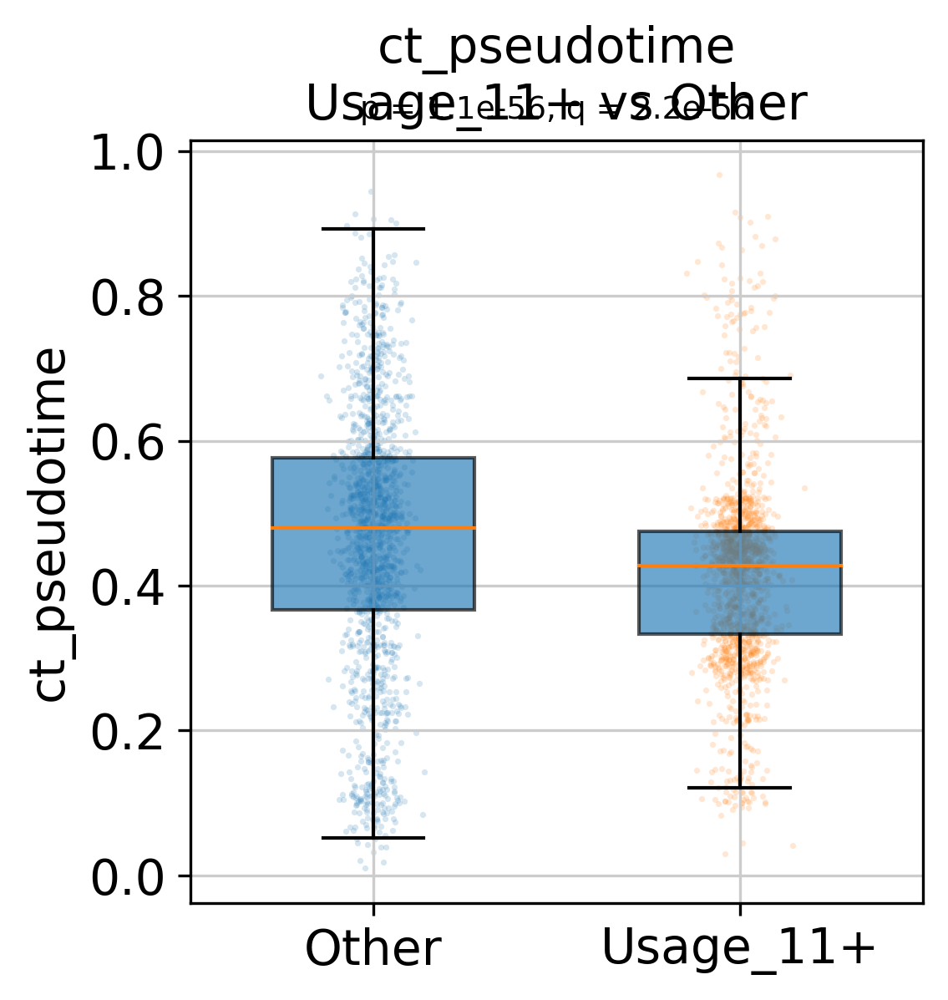

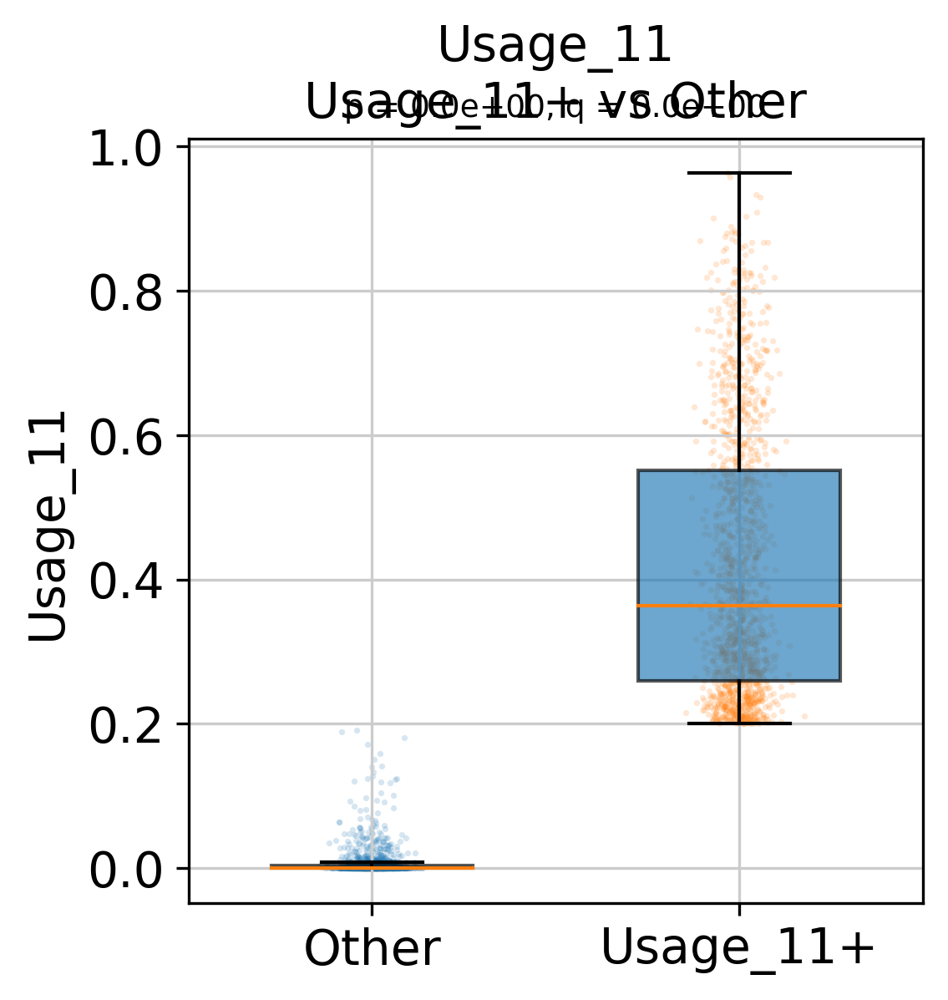

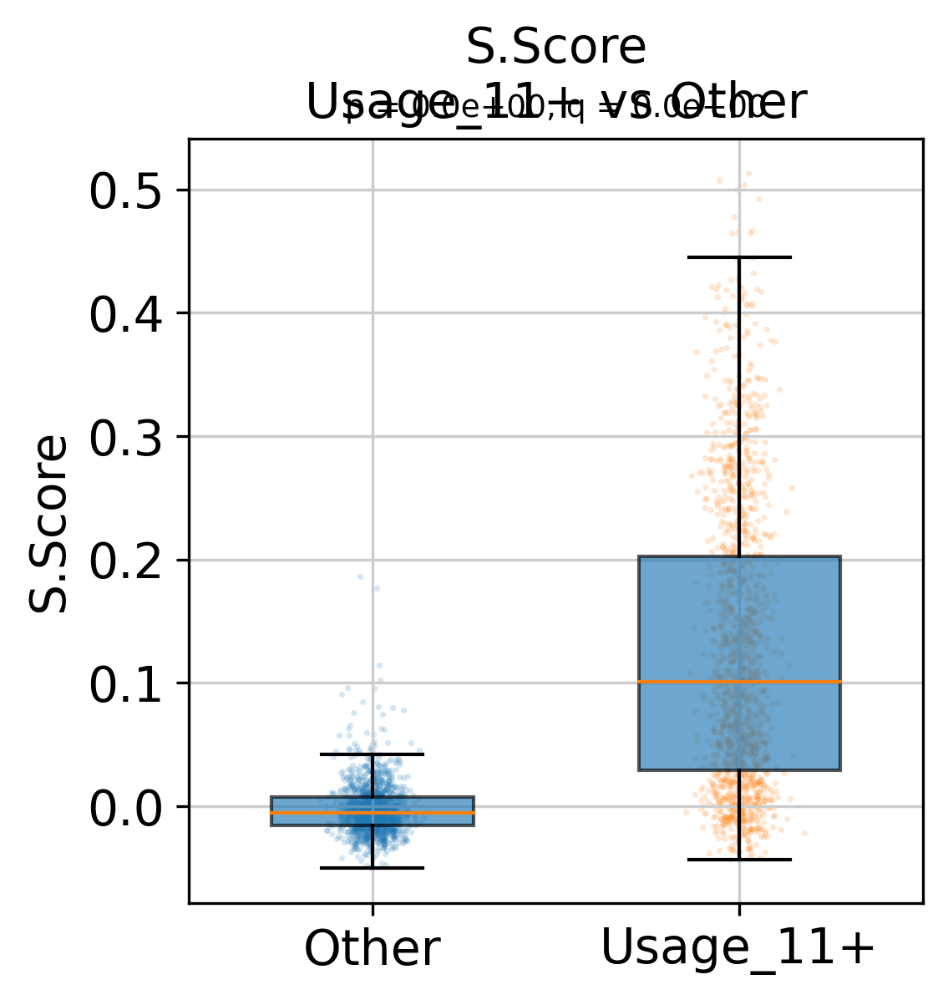

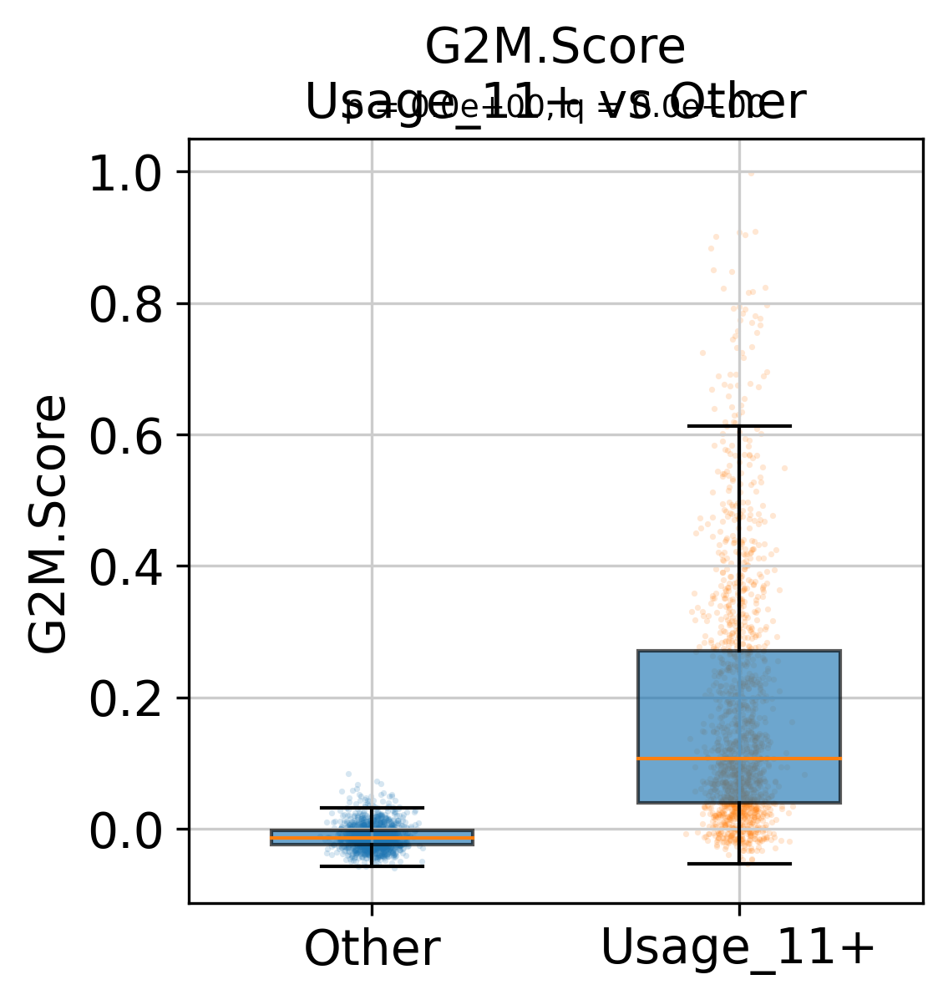

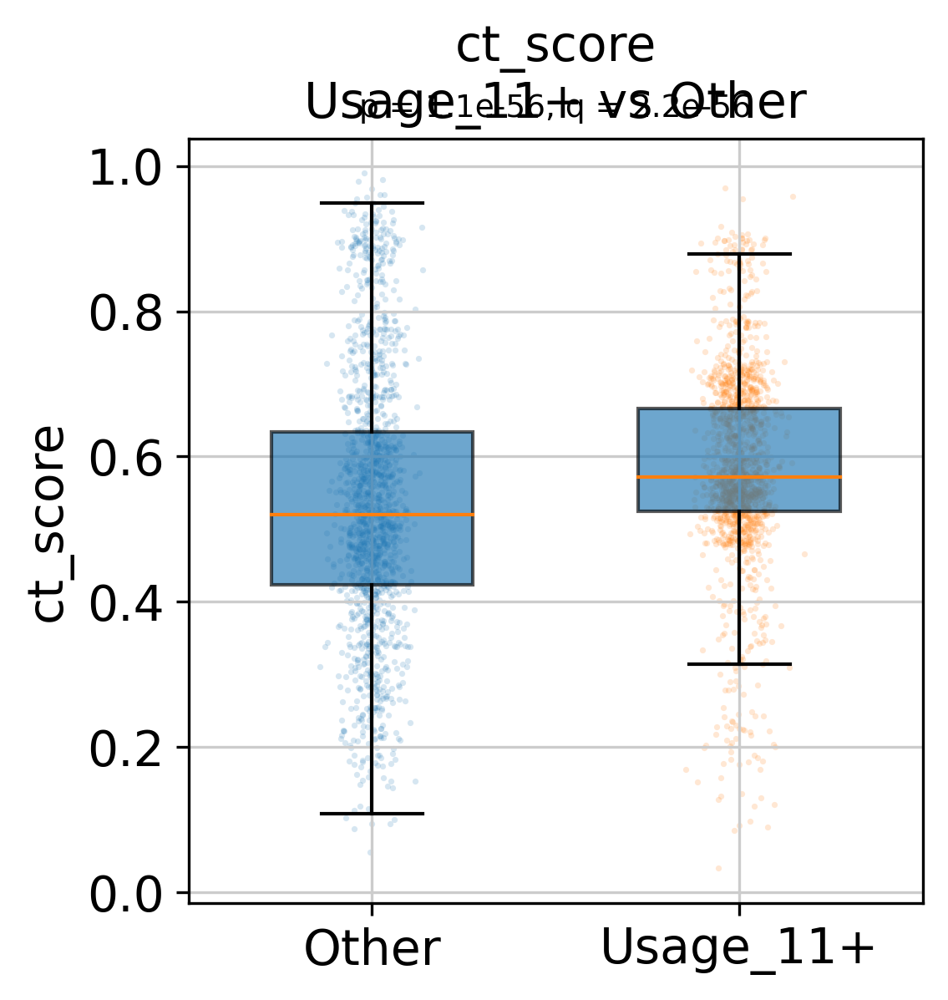

...

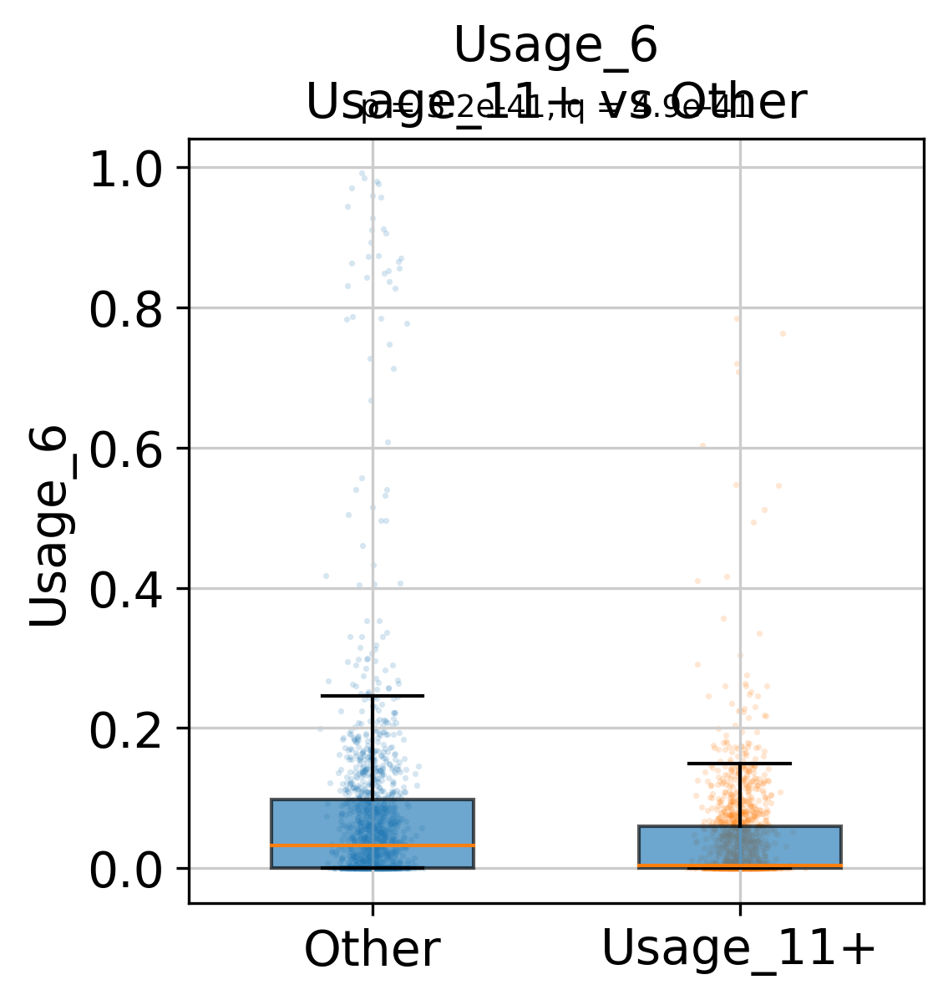

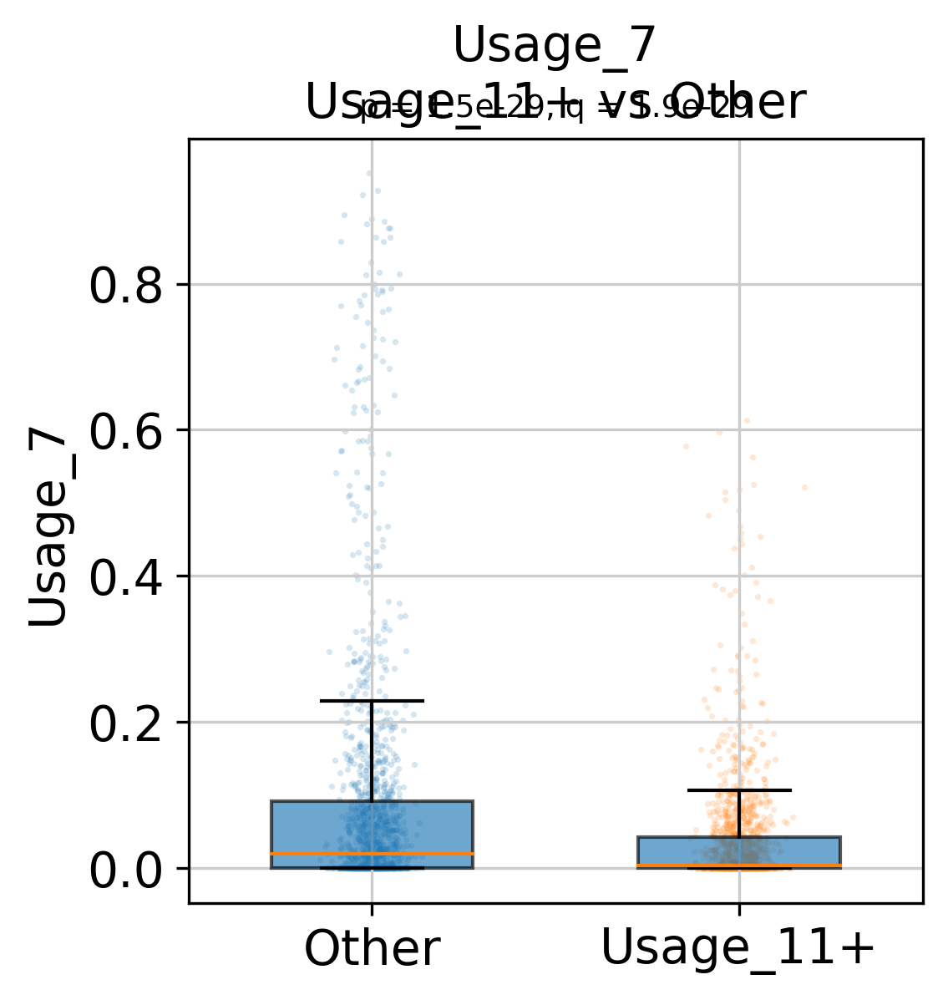

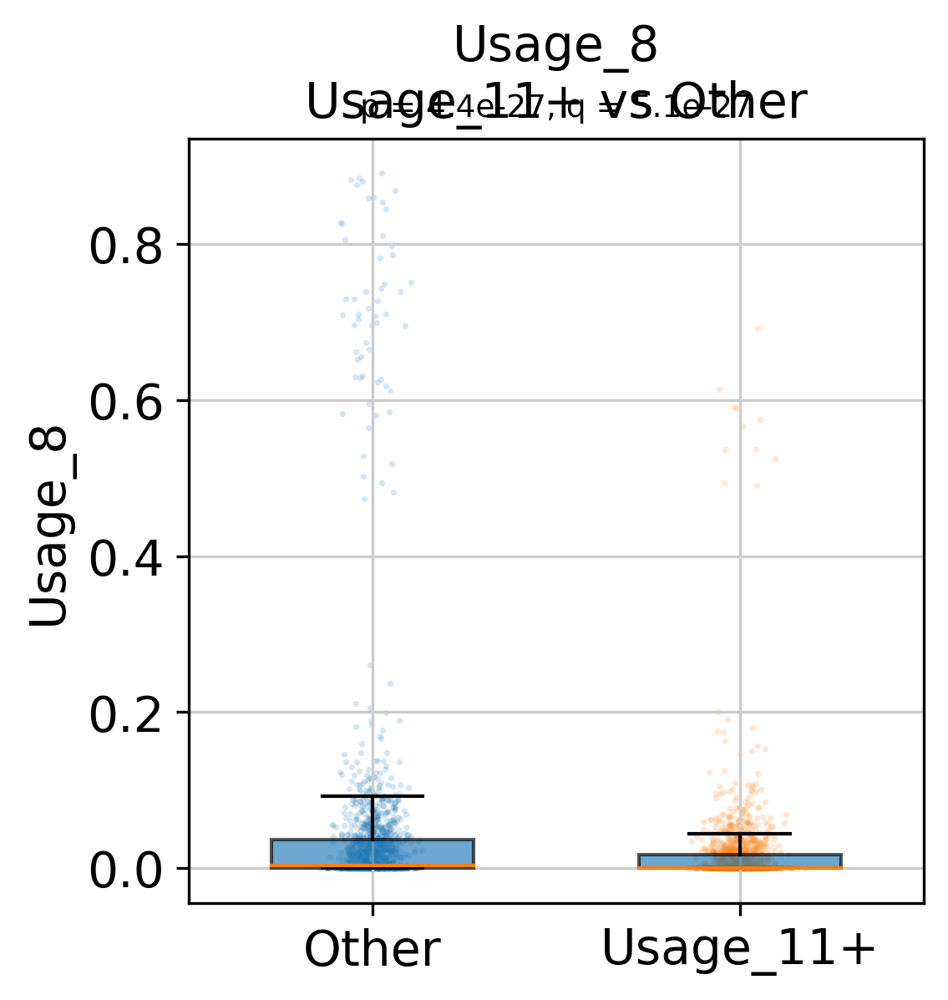

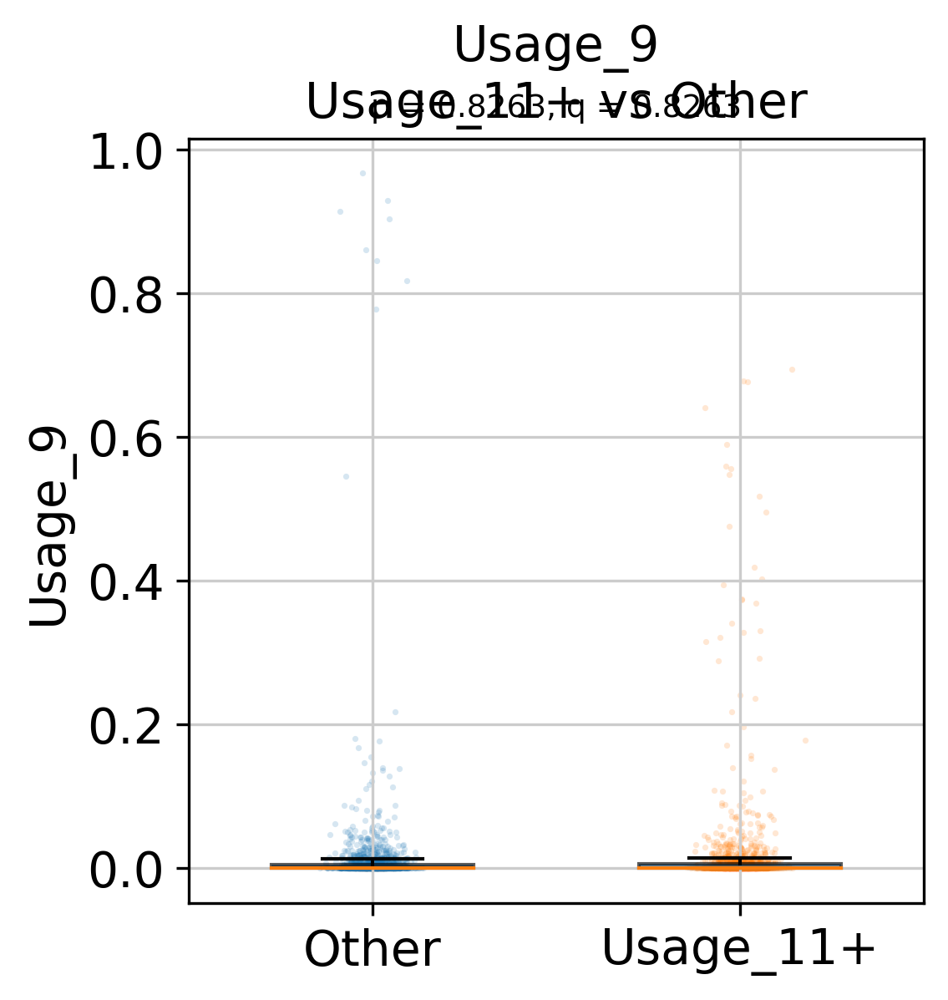

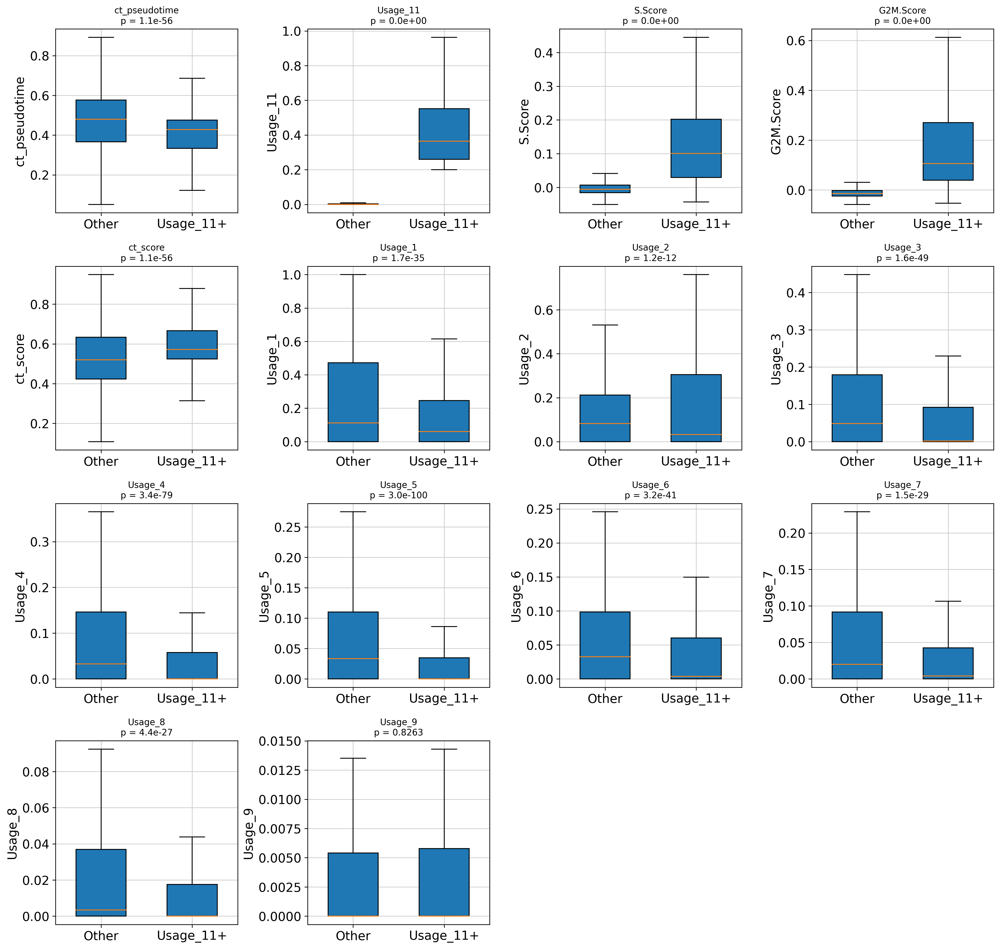

In [11]:
# ============================================================
# 9) GEP11 / Usage_11+ versus Other: pooled score analysis
# ============================================================

box_df = obs_small[
    obs_small["GEP11_status"].astype(str).isin(["GEP11", "Other"])
].copy()

box_df["GEP11_status"] = pd.Categorical(
    box_df["GEP11_status"].astype(str),
    categories=["Other", "GEP11"],
    ordered=True,
)

box_df[
    [sample_col, "patient_id", "timepoint", "GEP11_status"]
    + score_cols
].to_csv(
    gep_boxplot_dir
    / "GEP11_vs_other_single_cell_score_plotting_table.csv",
    index=True,
)

boxplot_stats = []

for score in score_cols:
    gep11 = pd.to_numeric(
        box_df.loc[
            box_df["GEP11_status"].astype(str) == "GEP11",
            score,
        ],
        errors="coerce",
    ).dropna()

    other = pd.to_numeric(
        box_df.loc[
            box_df["GEP11_status"].astype(str) == "Other",
            score,
        ],
        errors="coerce",
    ).dropna()

    if len(gep11) >= 10 and len(other) >= 10:
        statistic, p_value = stats.mannwhitneyu(
            gep11,
            other,
            alternative="two-sided",
        )
        test = "mannwhitney_single_cell_GEP11_vs_Other"
    else:
        statistic, p_value = np.nan, np.nan
        test = "insufficient_cells"

    boxplot_stats.append({
        "score": score,
        "n_GEP11": len(gep11),
        "n_Other": len(other),
        "mean_GEP11": gep11.mean() if len(gep11) else np.nan,
        "mean_Other": other.mean() if len(other) else np.nan,
        "median_GEP11": gep11.median() if len(gep11) else np.nan,
        "median_Other": other.median() if len(other) else np.nan,
        "delta_mean_GEP11_minus_Other": (
            gep11.mean() - other.mean()
            if len(gep11) and len(other)
            else np.nan
        ),
        "delta_median_GEP11_minus_Other": (
            gep11.median() - other.median()
            if len(gep11) and len(other)
            else np.nan
        ),
        "statistic": statistic,
        "p_value": p_value,
        "test": test,
    })

boxplot_stats = pd.DataFrame(boxplot_stats)

if boxplot_stats["p_value"].notna().any():
    valid = boxplot_stats["p_value"].notna()
    boxplot_stats.loc[valid, "q_value"] = multipletests(
        boxplot_stats.loc[valid, "p_value"],
        method="fdr_bh",
    )[1]
else:
    boxplot_stats["q_value"] = np.nan

boxplot_stats = boxplot_stats.sort_values(
    "p_value",
    na_position="last",
)

boxplot_stats.to_csv(
    gep_boxplot_dir
    / "GEP11_vs_other_single_cell_score_statistics.csv",
    index=False,
)

display(boxplot_stats)

# Individual boxplots: same seed and point cap as before
for score in score_cols:
    tmp = box_df[["GEP11_status", score]].copy()
    tmp[score] = pd.to_numeric(tmp[score], errors="coerce")
    tmp = tmp.dropna()

    other = tmp.loc[
        tmp["GEP11_status"].astype(str) == "Other", score
    ].values
    gep11 = tmp.loc[
        tmp["GEP11_status"].astype(str) == "GEP11", score
    ].values

    if len(other) == 0 or len(gep11) == 0:
        continue

    stat_row = boxplot_stats.loc[boxplot_stats["score"] == score]
    p_label = format_p_for_plot(stat_row["p_value"].iloc[0])
    q_label = format_p_for_plot(
        stat_row["q_value"].iloc[0]
    ).replace("p =", "q =")

    fig, ax = plt.subplots(figsize=(4, 4.2))

    boxplot = ax.boxplot(
        [other, gep11],
        labels=["Other", "Usage_11+"],
        showfliers=False,
        patch_artist=True,
        widths=0.55,
    )

    for patch in boxplot["boxes"]:
        patch.set_alpha(0.65)

    rng = np.random.default_rng(1)
    max_points_per_group = 1500

    for position, values in enumerate([other, gep11], start=1):
        values_plot = values
        if len(values_plot) > max_points_per_group:
            values_plot = rng.choice(
                values_plot,
                size=max_points_per_group,
                replace=False,
            )

        jitter = rng.normal(
            loc=position,
            scale=0.045,
            size=len(values_plot),
        )
        ax.scatter(
            jitter,
            values_plot,
            s=3,
            alpha=0.18,
            linewidths=0,
            rasterized=True,
        )

    ax.set_title(f"{score}\nUsage_11+ vs Other")
    ax.set_xlabel("")
    ax.set_ylabel(score)
    ax.text(
        0.5,
        1.02,
        f"{p_label}, {q_label}",
        transform=ax.transAxes,
        ha="center",
        va="bottom",
        fontsize=9,
    )

    plt.tight_layout()
    plt.savefig(
        gep_boxplot_dir
        / f"GEP11_vs_Other_boxplot_{safe_filename(score)}.pdf",
        bbox_inches="tight",
    )
    show_or_close(fig)

# Combined multipanel PDF
ncols = 4
nrows = int(np.ceil(len(score_cols) / ncols))

fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(4.0 * ncols, 3.8 * nrows),
    squeeze=False,
)

for ax, score in zip(axes.ravel(), score_cols):
    tmp = box_df[["GEP11_status", score]].copy()
    tmp[score] = pd.to_numeric(tmp[score], errors="coerce")
    tmp = tmp.dropna()

    other = tmp.loc[
        tmp["GEP11_status"].astype(str) == "Other", score
    ].values
    gep11 = tmp.loc[
        tmp["GEP11_status"].astype(str) == "GEP11", score
    ].values

    if len(other) == 0 or len(gep11) == 0:
        ax.axis("off")
        continue

    ax.boxplot(
        [other, gep11],
        labels=["Other", "Usage_11+"],
        showfliers=False,
        patch_artist=True,
        widths=0.55,
    )

    stat_row = boxplot_stats.loc[boxplot_stats["score"] == score]
    p_label = format_p_for_plot(stat_row["p_value"].iloc[0])

    ax.set_title(f"{score}\n{p_label}", fontsize=10)
    ax.set_xlabel("")
    ax.set_ylabel(score)

for ax in axes.ravel()[len(score_cols):]:
    ax.axis("off")

plt.tight_layout()
plt.savefig(
    gep_boxplot_dir / "GEP11_vs_Other_all_scores_boxplots.pdf",
    bbox_inches="tight",
)
show_or_close(fig)


In [12]:
# ============================================================
# 10) Save final annotated object and metadata
# ============================================================

out_h5ad = figdir / "plasma_cytotrace_origident_scores.h5ad"
adata.write(out_h5ad)

adata.obs.to_csv(
    figdir / "adata_obs_with_cytotrace_GEPs_and_GEP11.csv",
    index=True,
)

print(f"Saved annotated object: {out_h5ad}")
print(f"All outputs are under: {figdir.resolve()}")


Saved annotated object: cytotrace_origident_figures/plasma_cytotrace_origident_scores.h5ad
